## Imports

In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from plotly import express as px
from plotly import graph_objects as go
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import nltk
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec

tqdm.pandas()

In [ ]:
!gdown 1-AlW7oNJHaqi3xk_9dWHUS52Dzl_FmFW

Downloading...
From: https://drive.google.com/uc?id=1-AlW7oNJHaqi3xk_9dWHUS52Dzl_FmFW
To: /content/train_data.csv
100% 635M/635M [00:04<00:00, 131MB/s]


In [ ]:
!gdown 1I9aPAvvYgQWdHGKtnd7IeTGXpx8vOm4h

Downloading...
From: https://drive.google.com/uc?id=1I9aPAvvYgQWdHGKtnd7IeTGXpx8vOm4h
To: /content/title_brand.csv
100% 97.3M/97.3M [00:02<00:00, 46.8MB/s]


## Data

In [ ]:
title_brand = pd.read_csv('title_brand.csv')
title_brand.head()

,asin,title,brand
0,0011300000,Genuine Geovision 1 Channel 3rd Party NVR IP S...,GeoVision
1,0043396828,"Books ""Handbook of Astronomical Image Processi...",33 Books Co.
2,0060009810,One Hot Summer,Visit Amazon's Carolina Garcia Aguilera Page
3,0060219602,Hurray for Hattie Rabbit: Story and pictures (...,Visit Amazon's Dick Gackenbach Page
4,0060786817,sex.lies.murder.fame.: A Novel,Visit Amazon's Lolita Files Page


In [ ]:
df = pd.read_csv('train_data.csv')
df = df.merge(title_brand, on='asin')

<ipython-input-5-572df85bb219>:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('train_data.csv')


In [ ]:
df.head(3)

,overall,vote,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,title,brand
0,2,NaN,False,2016-11-11,A2OSUEZJIN7BI,0511189877,NaN,Chris,I have an older URC-WR7 remote and thought thi...,Cannot Learn,1478822400,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
1,5,NaN,True,2016-06-06,A2NETQRG6JHIG7,0511189877,NaN,Qrysta White,First time I've EVER had a remote that needed ...,zero programming needed! Miracle!?,1465171200,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
2,4,NaN,True,2016-03-10,A12JHGROAX49G7,0511189877,NaN,Linwood,Got them and only 2 of them worked. company ca...,Works Good and programs easy.,1457568000,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 855602 entries, 0 to 855601
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         855602 non-null  int64 
 1   vote            194684 non-null  object
 2   verified        855602 non-null  bool  
 3   reviewTime      855602 non-null  object
 4   reviewerID      855602 non-null  object
 5   asin            855602 non-null  object
 6   style           502073 non-null  object
 7   reviewerName    855393 non-null  object
 8   reviewText      855602 non-null  object
 9   summary         855525 non-null  object
 10  unixReviewTime  855602 non-null  int64 
 11  title           855601 non-null  object
 12  brand           854444 non-null  object
dtypes: bool(1), int64(2), object(10)
memory usage: 85.7+ MB


### Null Values

In [ ]:
df.isna().sum()/df.shape[0]

overall           0.000000
vote              0.772460
verified          0.000000
reviewTime        0.000000
reviewerID        0.000000
asin              0.000000
style             0.413193
reviewerName      0.000244
reviewText        0.000000
summary           0.000090
unixReviewTime    0.000000
title             0.000001
brand             0.001353
dtype: float64

## EDA

### Overall Distribution

In [ ]:
overall = df['overall'].value_counts()
fig = px.pie(values=overall.values, names=overall.index, title='Overall Distribution')
fig.show()

### WordCloud

In [ ]:
def show_wordcloud(text, stop_words=STOPWORDS):
  wordcloud = WordCloud(width=1200, height=500, background_color='white', margin=2, stopwords=stop_words).generate(' '.join(text))

  plt.figure(figsize=(20, 10))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()
  plt.tight_layout();

In [ ]:
df['opinion'] = df['overall'].apply(lambda row: 'positive' if row >= 4 else ('neutral' if row == 3 else 'negative'))

#### Positive Opionions

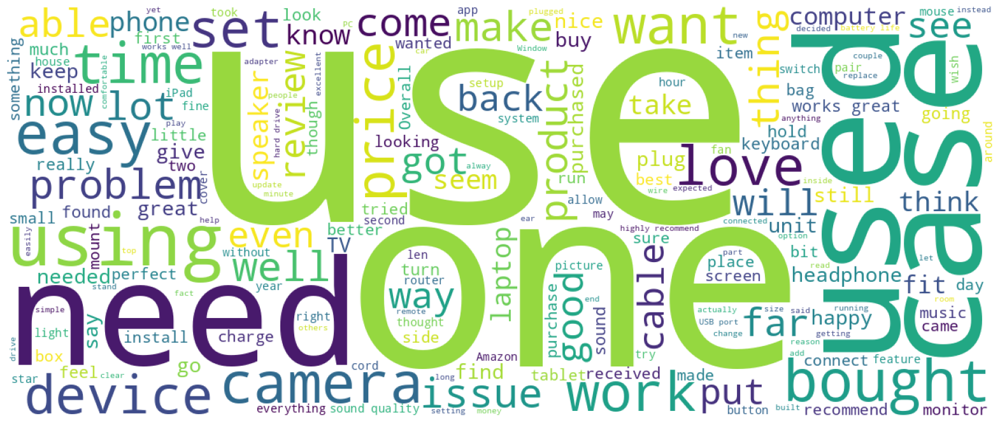

<Figure size 640x480 with 0 Axes>

In [ ]:
positive = df[df['opinion'] == 'positive']['reviewText']
show_wordcloud(positive)

#### Neutral Opinions

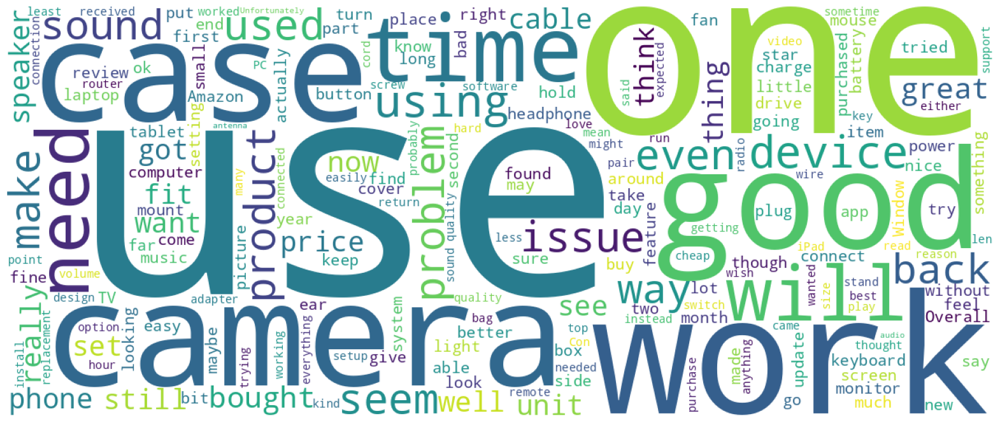

<Figure size 640x480 with 0 Axes>

In [ ]:
neutral = df[df['opinion'] == 'neutral']['reviewText'].values
show_wordcloud(neutral)

#### Negative Opionions

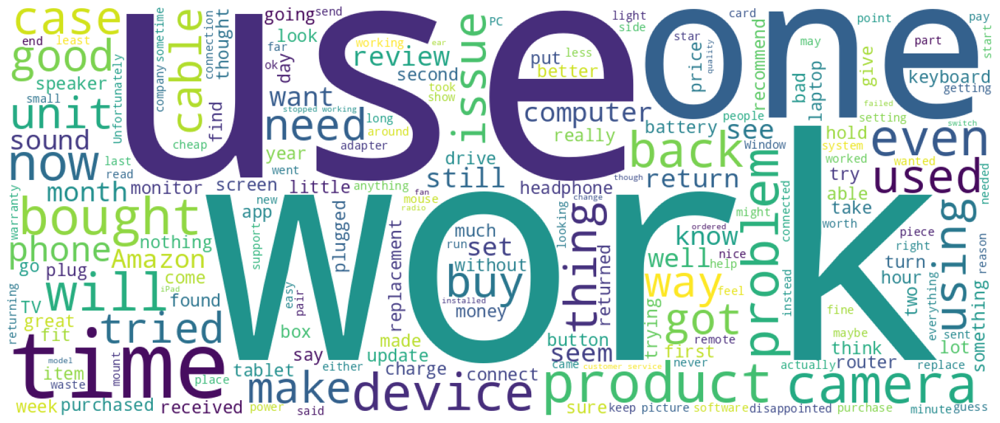

<Figure size 640x480 with 0 Axes>

In [ ]:
negative = df[df['opinion'] == 'negative']['reviewText'].values
show_wordcloud(negative)

### Top 10 Reviewers Based on Number of Useful Reviews

In [ ]:
votes = (df[df['vote'].isna() == False][['reviewerName', 'reviewerID', 'vote']])
votes.loc[:, 'vote'] = votes['vote'].apply(lambda x: str(x).replace(',', ''))
votes = votes.astype({'vote': 'float'})
top10_reviewers = votes.groupby(by=['reviewerID', 'reviewerName']).sum().reset_index().sort_values(by=['vote'], ascending=False)[:10]
top10_reviewers

,reviewerID,reviewerName,vote
37758,A25GROL6KJV3QG,Benson Leung,4572.0
84236,A3KJ0DF3LTNJ6X,Voltron00x,3181.0
49597,A2IK776FY6MEMG,Obi Wan,3150.0
18911,A1KPFZCS71QKW5,nycebo,2978.0
111828,AMYCUX8EWEUVV,Mayra S.,2631.0
103501,ADLVFFE4VBT8,Cthulhu,2607.0
15129,A1GHPJB2N0D0RL,Chris Upton,2167.0
120204,AW7UMXXJKFSNS,Sally B.,1912.0
68532,A33AN9NP6574M2,DJ,1867.0
61484,A2VQ0V1TWXF3U7,Mark A. Baker,1820.0


In [ ]:
fig = px.bar(top10_reviewers, x='reviewerName', y='vote', title='Top 10 Reviewers based on useful comments')
fig.show()

### Review Texts Length Histogram

In [ ]:
df['reviewTextLen'] = df['reviewText'].apply(lambda s: len(s))

In [ ]:
fig = px.histogram(df, x="reviewTextLen")
fig.show()

#### Review Texts Length Seperated by Overall Rating

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df['reviewText'][df['overall']==1].apply(lambda x: len(x)), name='1'))
fig.add_trace(go.Histogram(x=df['reviewText'][df['overall']==2].apply(lambda x: len(x)), name='2'))
fig.add_trace(go.Histogram(x=df['reviewText'][df['overall']==3].apply(lambda x: len(x)), name='3'))
fig.add_trace(go.Histogram(x=df['reviewText'][df['overall']==4].apply(lambda x: len(x)), name='4'))
fig.add_trace(go.Histogram(x=df['reviewText'][df['overall']==5].apply(lambda x: len(x)), name='5'))
fig.update_traces(opacity=0.7)
fig.update_layout(barmode='overlay', title='Text Length Distribution')
fig.show()

### Top 10 Products Based on 5 Star Rating

In [ ]:
top10_products = df[df['overall'] == 5].groupby(by=['asin', 'title', 'brand']).count().sort_values(by=['overall'], ascending=False).reset_index()[['title', 'brand', 'overall']][:10]
top10_products

,title,brand,overall
0,OontZ Angle 3 Enhanced Stereo Edition IPX5 Spl...,Cambridge Soundworks,1163
1,NETGEAR N300 WiFi Range Extender (EX2700),NETGEAR,659
2,Roku Streaming Stick (3600R) - HD Streaming Pl...,Roku,600
3,StarTech USB 2.0 to SATA IDE Adapter (USB2SATA...,StarTech,598
4,Logitech M570 Wireless Trackball Mouse &ndash;...,Logitech,552
5,Samsung 850 EVO 500GB 2.5-Inch SATA III Intern...,Samsung,529
6,NETGEAR 5-Port Gigabit Ethernet Unmanaged Swit...,NETGEAR,482
7,ASUS Tri-Band Gigabit (AC3200) WiFi Router (Up...,Asus,471
8,VideoSecu ML531BE TV Wall Mount for Most 27&qu...,VideoSecu,448
9,Arlo - Wireless Home Security Camera System | ...,"Arlo Technologies, Inc",433


In [ ]:
fig = px.bar(top10_products, x='brand', y='overall', hover_data=['title'], title='Top 10 brands based on number of 5 star ratings on a single product')
fig.show()

### Top 10 Reveiwed Brands Average Rating

In [ ]:
top10_reviewed_brands = df.groupby(by=['brand']).count().sort_values(by=['reviewText'], ascending=False)[:10].index.tolist()
top10_reviewed_brands = df[df['brand'].isin(top10_reviewed_brands)].groupby(['brand']).mean(numeric_only=True).reset_index()[['brand', 'overall']]
top10_reviewed_brands

,brand,overall
0,AmazonBasics,4.201468
1,Anker,4.244320
2,Asus,3.855550
3,Logitech,3.954061
4,NETGEAR,3.836274
5,Sabrent,4.028005
6,Samsung,3.941268
7,SanDisk,3.958810
8,Sony,3.938726
9,TP-LINK,3.928681


## Customer Satisfaction

##### Load Saved To Save Time

In [ ]:
df = pd.read_csv('drive/MyDrive/Data/quera/train_rt_tokenized.csv', index_col=0)
model = Word2Vec.load('drive/MyDrive/Data/quera/w2v')

<ipython-input-3-7691d3b4b668>:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('drive/MyDrive/Data/quera/train_rt_tokenized.csv', index_col=0)


##### Or Process Again!

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
df.loc[:, 'reviewTextTokens'] = df['reviewText'].progress_apply(lambda t: word_tokenize(t))

In [ ]:
model = Word2Vec(sentences=df['reviewTextTokens'].values.tolist(), vector_size=100, window=5, min_count=1, workers=4)

##### Continue

In [ ]:
sims = model.wv.most_similar(['warranty', 'guarantee'], topn=100)  # get other similar words

In [ ]:
gwords = []
for word in sims:
  gwords.append(word[0])

In [ ]:
gwords

['warrantee',
 'warrenty',
 'warranties',
 'guaranty',
 'warantee',
 'Warranty',
 'contract',
 'honor',
 'policy',
 'warranty-',
 'rebate',
 'promise',
 'guarantees',
 'honored',
 'Trade',
 'SquareTrade',
 'warrantied',
 'return/exchange',
 'refunds',
 'commitments',
 'commitment',
 'Guarantee',
 'Square',
 'mail-in',
 'Warrenty',
 'declined',
 'authorize',
 'guarentee',
 'rebates',
 'policies',
 'return',
 'denying',
 'LIFETIME',
 'honoring',
 'expire',
 'RMA',
 '90-day',
 'return/replacement',
 '30-day',
 '1-year',
 'rma',
 'expiration',
 'return/refund',
 'Asurion',
 'Squaretrade',
 'subscription',
 '12-month',
 'honors',
 'honour',
 'Lifetime',
 'expired',
 'lifetime',
 'money-back',
 'reply',
 'life-time',
 'deny',
 'squaretrade',
 'request',
 'guarrantee',
 'one-year',
 'waived',
 'insurance',
 'reimbursement',
 'renewal',
 'WA7210N',
 'Assurant',
 'fulfillment',
 'claim',
 'invoice',
 'payment',
 'eligibility',
 'warraty.so',
 'warranty.',
 'warranty.will',
 'deductible',
 'loya

In [ ]:
contains_gword = df.loc[df['reviewText'].str.contains('|'.join(gwords)), :]

In [ ]:
average_rating = contains_gword.groupby(['asin', 'title', 'brand']).mean(numeric_only=True).reset_index()[['asin', 'title', 'brand', 'overall']].sort_values('overall', ascending=False)
average_rating

,asin,title,brand,overall
57269,B01HJH42KU,Jricoo Nylon Braided 2.0 Micro USB Charging Ca...,Jricoo,5.0
41861,B0154TALHS,JOYING Mini Elm327 OBD2 Scanner Blueooth Diagn...,Joying,5.0
41843,B0154MCMUO,New Portable 100&quot; Projector 16:9 Projecti...,BestMassage,5.0
41844,B0154MOY32,JUYOON Dongle Tip Dc Power Converter Cable for...,JUYOON,5.0
16086,B00D2LEHIU,Orion 10145 Dual Finder Scope Mounting Bracket,ORION,5.0
...,...,...,...,...
39473,B012OXCVEI,Bluetooth Adapter for Stereo Receiver or Headp...,Audiojem,1.0
52241,B01DLL3XLC,Tcoolgroup Robot Hi-Speed 4-Port USB Hub for W...,Tcoolgroup,1.0
18260,B00F3ZN536,Netgear WNR2500-100NAS IEEE 802.11n 450 Mbps W...,NETGEAR,1.0
18250,B00F3T2M0E,Generic htfd 3 Port HDMI Pigtail Switch with 5...,Generic,1.0


In [ ]:
fig = px.histogram(average_rating, x="overall")
fig.show()